In [0]:
pip install wget

Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
pip install bs4

Python interpreter will be restarted.
Python interpreter will be restarted.


## Importing the required libraries

In [0]:
import pyspark 
from pyspark.sql import SparkSession
from pyspark.sql.types import StructType,StructField,StringType,IntegerType,DateType,BooleanType,DoubleType,TimestampType
import pyspark.sql.functions as F
from pyspark.sql.functions import to_timestamp
from pyspark.sql.functions import *
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import pandas as pd
import glob
import wget
from zipfile import ZipFile
import zipfile
import requests
from bs4 import BeautifulSoup

## Creating a spark session

In [0]:
spark = SparkSession.builder.appName("603_project").getOrCreate()

## Collecting the data using BeautifulSoup

In [0]:
import requests
from bs4 import BeautifulSoup

url = 'https://divvy-tripdata.s3.amazonaws.com'
response = requests.get(url)
soup = BeautifulSoup(response.content, 'html.parser')
links = soup.find_all('key')

/databricks/python/lib/python3.9/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML parser will be more reliable. To parse this document as XML, make sure you have the lxml package installed, and pass the keyword argument `features="xml"` into the BeautifulSoup constructor.
  warnings.warn(


In [0]:
li=[]
for link in links:
    li.append(link.text)
li.pop()
li

Out[4]: ['202004-divvy-tripdata.zip',
 '202005-divvy-tripdata.zip',
 '202006-divvy-tripdata.zip',
 '202007-divvy-tripdata.zip',
 '202008-divvy-tripdata.zip',
 '202009-divvy-tripdata.zip',
 '202010-divvy-tripdata.zip',
 '202011-divvy-tripdata.zip',
 '202012-divvy-tripdata.zip',
 '202101-divvy-tripdata.zip',
 '202102-divvy-tripdata.zip',
 '202103-divvy-tripdata.zip',
 '202104-divvy-tripdata.zip',
 '202105-divvy-tripdata.zip',
 '202106-divvy-tripdata.zip',
 '202107-divvy-tripdata.zip',
 '202108-divvy-tripdata.zip',
 '202109-divvy-tripdata.zip',
 '202110-divvy-tripdata.zip',
 '202111-divvy-tripdata.zip',
 '202112-divvy-tripdata.zip',
 '202201-divvy-tripdata.zip',
 '202202-divvy-tripdata.zip',
 '202203-divvy-tripdata.zip',
 '202204-divvy-tripdata.zip',
 '202205-divvy-tripdata.zip',
 '202206-divvy-tripdata.zip',
 '202207-divvy-tripdata.zip',
 '202208-divvy-tripdata.zip',
 '202209-divvy-tripdata.zip',
 '202210-divvy-tripdata.zip',
 '202211-divvy-tripdata.zip',
 '202212-divvy-tripdata.zip',
 '

In [0]:
%ls

azure/  eventlogs/                   logs/          preload_class.lst*
conf/   hadoop_accessed_config.lst*  metastore_db/


In [0]:
%mkdir project

In [0]:
%cd project

/databricks/driver/project


In [0]:
%pwd

Out[8]: '/databricks/driver/project'

In [0]:
url ="https://divvy-tripdata.s3.amazonaws.com/"
for file in li:
    name = wget.download(url+file)
    print(name)

202004-divvy-tripdata.zip
202005-divvy-tripdata.zip
202006-divvy-tripdata.zip
202007-divvy-tripdata.zip
202008-divvy-tripdata.zip
202009-divvy-tripdata.zip
202010-divvy-tripdata.zip
202011-divvy-tripdata.zip
202012-divvy-tripdata.zip
202101-divvy-tripdata.zip
202102-divvy-tripdata.zip
202103-divvy-tripdata.zip
202104-divvy-tripdata.zip
202105-divvy-tripdata.zip
202106-divvy-tripdata.zip
202107-divvy-tripdata.zip
202108-divvy-tripdata.zip
202109-divvy-tripdata.zip
202110-divvy-tripdata.zip
202111-divvy-tripdata.zip
202112-divvy-tripdata.zip
202201-divvy-tripdata.zip
202202-divvy-tripdata.zip
202203-divvy-tripdata.zip
202204-divvy-tripdata.zip
202205-divvy-tripdata.zip
202206-divvy-tripdata.zip
202207-divvy-tripdata.zip
202208-divvy-tripdata.zip
202209-divvy-tripdata.zip
202210-divvy-tripdata.zip
202211-divvy-tripdata.zip
202212-divvy-tripdata.zip
202301-divvy-tripdata.zip
202302-divvy-tripdata.zip
202303-divvy-tripdata.zip
202304-divvy-tripdata.zip
Divvy_Stations_Trips_2013.zip
Divvy_St

## Extracting the zip files

In [0]:
for file in li:
    with ZipFile(file, 'r') as zip:
        zip.extractall()
print("All files are extracted")

All files are extracted


In [0]:
path = "/databricks/driver/project"
filenames = glob.glob(path + "/*.csv")
#print('File names:', filenames)

In [0]:
ls *.csv

202004-divvy-tripdata.csv        202212-divvy-tripdata.csv
202005-divvy-tripdata.csv        202301-divvy-tripdata.csv
202006-divvy-tripdata.csv        202302-divvy-tripdata.csv
202007-divvy-tripdata.csv        202303-divvy-tripdata.csv
202008-divvy-tripdata.csv        202304-divvy-tripdata.csv
202009-divvy-tripdata.csv        Divvy_Stations_2015.csv
202010-divvy-tripdata.csv        Divvy_Stations_2016_Q3.csv
202011-divvy-tripdata.csv        Divvy_Stations_2016_Q4.csv
202012-divvy-tripdata.csv        Divvy_Stations_2017_Q1Q2.csv
202101-divvy-tripdata.csv        Divvy_Stations_2017_Q3Q4.csv
202102-divvy-tripdata.csv        Divvy_Trips_2014_Q1Q2.csv
202103-divvy-tripdata.csv        Divvy_Trips_2015-Q1.csv
202104-divvy-tripdata.csv        Divvy_Trips_2015-Q2.csv
202105-divvy-tripdata.csv        Divvy_Trips_2015_07.csv
202106-divvy-tripdata.csv        Divvy_Trips_2015_08.csv
202107-divvy-tripdata.csv        Divvy_Trips_2015_09.csv
202108-divvy-tripdata.csv        Divvy_Trips_2015_Q4.csv
202

## Reading the data

In [0]:
df = spark.read.csv("file:/databricks/driver/project/20*.csv", header=True, inferSchema=True)

In [0]:
df.count()

Out[14]: 15443590

In [0]:
df2 = spark.read.csv("file:/databricks/driver/project/Divvy_Trip*.csv", header=True, inferSchema=True)

In [0]:
df2.count()

Out[17]: 17891768

In [0]:
df.printSchema()

root
 |-- ride_id: string (nullable = true)
 |-- rideable_type: string (nullable = true)
 |-- started_at: string (nullable = true)
 |-- ended_at: string (nullable = true)
 |-- start_station_name: string (nullable = true)
 |-- start_station_id: string (nullable = true)
 |-- end_station_name: string (nullable = true)
 |-- end_station_id: string (nullable = true)
 |-- start_lat: string (nullable = true)
 |-- start_lng: string (nullable = true)
 |-- end_lat: string (nullable = true)
 |-- end_lng: string (nullable = true)
 |-- member_casual: string (nullable = true)



In [0]:
df2.printSchema()

root
 |-- trip_id: string (nullable = true)
 |-- starttime: string (nullable = true)
 |-- stoptime: string (nullable = true)
 |-- bikeid: string (nullable = true)
 |-- tripduration: string (nullable = true)
 |-- from_station_id: string (nullable = true)
 |-- from_station_name: string (nullable = true)
 |-- to_station_id: string (nullable = true)
 |-- to_station_name: string (nullable = true)
 |-- usertype: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- birthyear: string (nullable = true)



## Data Preprocessing

#### Renaming the columns

In [0]:
df2 = df2.withColumnRenamed("starttime", "started_at").withColumnRenamed("stoptime", "ended_at").withColumnRenamed("from_station_name", "start_station_name").withColumnRenamed("from_station_id", "start_station_id").withColumnRenamed("to_station_name", "end_station_name").withColumnRenamed("to_station_id", "end_station_id")

In [0]:
df2.count()

Out[22]: 17891768

#### Removing the null values

In [0]:
df2_na = df2.na.drop()

In [0]:
df2_na.count()

Out[24]: 14153469

#### Making the data into one standard format

In [0]:
df = df.withColumnRenamed("ride_id", "trip_id").withColumnRenamed("member_casual", "usertype")

In [0]:
df = df.withColumn("started_at", to_timestamp("started_at", "yyyy-MM-dd HH:mm:ss"))
df = df.withColumn("ended_at", to_timestamp("ended_at", "yyyy-MM-dd HH:mm:ss"))

In [0]:
df = df.withColumn( "tripduration", (F.col("ended_at").cast("long") - F.col("started_at").cast("long")))

In [0]:
df = df.withColumn("usertype",when((df["usertype"] == 'member') ,'Subscriber').otherwise(df['usertype']))

In [0]:
df = df.withColumn("usertype",when((df["usertype"] == 'casual') ,'Customer').otherwise(df['usertype']))

In [0]:
df.count()

Out[31]: 15443590

In [0]:
df_na = df.na.drop()

In [0]:
df_na.count()

Out[33]: 12742645

## Combining both the dataframes

In [0]:
data = df_na.unionByName(df2_na, allowMissingColumns=True)

In [0]:
display(data)

trip_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,usertype,tripduration,bikeid,gender,birthyear
0D904FEC5F84A538,classic_bike,2021-06-04 07:29:18,2021-06-04 07:45:34,Orleans St & Elm St,TA1306000006,Orleans St & Elm St,TA1306000006,41.902924,-87.637715,41.902924,-87.637715,Subscriber,976,null,null,null
C4185F300D6B552B,classic_bike,2021-06-23 08:39:36,2021-06-23 08:41:37,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,121,null,null,null
60F97090AC85F55E,classic_bike,2021-06-27 12:26:58,2021-06-27 12:34:45,Clark St & Grace St,TA1307000127,Clark St & Leland Ave,TA1309000014,41.95078,-87.659172,41.967096,-87.667429,Subscriber,467,null,null,null
FBC7B1F0160AA304,classic_bike,2021-06-01 12:30:24,2021-06-01 12:33:02,Kingsbury St & Kinzie St,KA1503000043,Desplaines St & Kinzie St,TA1306000003,41.88917683258,-87.6385057718,41.888716036,-87.6444478533,Subscriber,158,null,null,null
37A52001AEEFA4E5,classic_bike,2021-06-01 11:32:17,2021-06-01 11:34:43,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,146,null,null,null
E49E5426F0B74023,classic_bike,2021-06-17 17:55:12,2021-06-17 17:58:50,Kingsbury St & Kinzie St,KA1503000043,Desplaines St & Kinzie St,TA1306000003,41.88917683258,-87.6385057718,41.888716036,-87.6444478533,Subscriber,218,null,null,null
C0B2A2D07DA7795A,classic_bike,2021-06-14 21:18:10,2021-06-14 21:50:44,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1954,null,null,null
318F391B5A5E11EA,classic_bike,2021-06-17 20:06:38,2021-06-17 20:25:10,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1112,null,null,null
A0FCE305E80B1CF0,classic_bike,2021-06-14 07:31:58,2021-06-14 07:34:44,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,166,null,null,null
1402BC0102F8401B,classic_bike,2021-06-29 23:30:06,2021-06-29 23:57:04,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1618,null,null,null


In [0]:
data.count()

Out[37]: 26896114

In [0]:
#data.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df.columns]).show()

In [0]:
data = data.withColumn("started_at", to_timestamp("started_at", "yyyy-MM-dd HH:mm:ss"))
data = data.withColumn("ended_at", to_timestamp("ended_at", "yyyy-MM-dd HH:mm:ss"))

In [0]:
data.printSchema()

root
 |-- trip_id: string (nullable = true)
 |-- rideable_type: string (nullable = true)
 |-- started_at: timestamp (nullable = true)
 |-- ended_at: timestamp (nullable = true)
 |-- start_station_name: string (nullable = true)
 |-- start_station_id: string (nullable = true)
 |-- end_station_name: string (nullable = true)
 |-- end_station_id: string (nullable = true)
 |-- start_lat: string (nullable = true)
 |-- start_lng: string (nullable = true)
 |-- end_lat: string (nullable = true)
 |-- end_lng: string (nullable = true)
 |-- usertype: string (nullable = true)
 |-- tripduration: string (nullable = true)
 |-- bikeid: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- birthyear: string (nullable = true)



In [0]:
data = data.withColumn('Start_Hour',hour(data.started_at))
data = data.withColumn('Start_Month',month(data.started_at))
data = data.withColumn('Start_Day',date_format(col("started_at"), "EEEE"))
data = data.withColumn('Ride_year',year(data.started_at))

In [0]:
display(data)

trip_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,usertype,tripduration,bikeid,gender,birthyear,Start_Hour,Start_Month,Start_Day,Ride_year
0D904FEC5F84A538,classic_bike,2021-06-04T07:29:18.000+0000,2021-06-04T07:45:34.000+0000,Orleans St & Elm St,TA1306000006,Orleans St & Elm St,TA1306000006,41.902924,-87.637715,41.902924,-87.637715,Subscriber,976,null,null,null,7,6,Friday,2021
C4185F300D6B552B,classic_bike,2021-06-23T08:39:36.000+0000,2021-06-23T08:41:37.000+0000,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,121,null,null,null,8,6,Wednesday,2021
60F97090AC85F55E,classic_bike,2021-06-27T12:26:58.000+0000,2021-06-27T12:34:45.000+0000,Clark St & Grace St,TA1307000127,Clark St & Leland Ave,TA1309000014,41.95078,-87.659172,41.967096,-87.667429,Subscriber,467,null,null,null,12,6,Sunday,2021
FBC7B1F0160AA304,classic_bike,2021-06-01T12:30:24.000+0000,2021-06-01T12:33:02.000+0000,Kingsbury St & Kinzie St,KA1503000043,Desplaines St & Kinzie St,TA1306000003,41.88917683258,-87.6385057718,41.888716036,-87.6444478533,Subscriber,158,null,null,null,12,6,Tuesday,2021
37A52001AEEFA4E5,classic_bike,2021-06-01T11:32:17.000+0000,2021-06-01T11:34:43.000+0000,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,146,null,null,null,11,6,Tuesday,2021
E49E5426F0B74023,classic_bike,2021-06-17T17:55:12.000+0000,2021-06-17T17:58:50.000+0000,Kingsbury St & Kinzie St,KA1503000043,Desplaines St & Kinzie St,TA1306000003,41.88917683258,-87.6385057718,41.888716036,-87.6444478533,Subscriber,218,null,null,null,17,6,Thursday,2021
C0B2A2D07DA7795A,classic_bike,2021-06-14T21:18:10.000+0000,2021-06-14T21:50:44.000+0000,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1954,null,null,null,21,6,Monday,2021
318F391B5A5E11EA,classic_bike,2021-06-17T20:06:38.000+0000,2021-06-17T20:25:10.000+0000,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1112,null,null,null,20,6,Thursday,2021
A0FCE305E80B1CF0,classic_bike,2021-06-14T07:31:58.000+0000,2021-06-14T07:34:44.000+0000,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,166,null,null,null,7,6,Monday,2021
1402BC0102F8401B,classic_bike,2021-06-29T23:30:06.000+0000,2021-06-29T23:57:04.000+0000,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1618,null,null,null,23,6,Tuesday,2021


In [0]:
display(data)

trip_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,usertype,tripduration,bikeid,gender,birthyear,Start_Hour,Start_Month,Start_Day,Ride_year
0D904FEC5F84A538,classic_bike,2021-06-04T07:29:18.000+0000,2021-06-04T07:45:34.000+0000,Orleans St & Elm St,TA1306000006,Orleans St & Elm St,TA1306000006,41.902924,-87.637715,41.902924,-87.637715,Subscriber,976,null,null,null,7,6,Friday,2021
C4185F300D6B552B,classic_bike,2021-06-23T08:39:36.000+0000,2021-06-23T08:41:37.000+0000,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,121,null,null,null,8,6,Wednesday,2021
60F97090AC85F55E,classic_bike,2021-06-27T12:26:58.000+0000,2021-06-27T12:34:45.000+0000,Clark St & Grace St,TA1307000127,Clark St & Leland Ave,TA1309000014,41.95078,-87.659172,41.967096,-87.667429,Subscriber,467,null,null,null,12,6,Sunday,2021
FBC7B1F0160AA304,classic_bike,2021-06-01T12:30:24.000+0000,2021-06-01T12:33:02.000+0000,Kingsbury St & Kinzie St,KA1503000043,Desplaines St & Kinzie St,TA1306000003,41.88917683258,-87.6385057718,41.888716036,-87.6444478533,Subscriber,158,null,null,null,12,6,Tuesday,2021
37A52001AEEFA4E5,classic_bike,2021-06-01T11:32:17.000+0000,2021-06-01T11:34:43.000+0000,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,146,null,null,null,11,6,Tuesday,2021
E49E5426F0B74023,classic_bike,2021-06-17T17:55:12.000+0000,2021-06-17T17:58:50.000+0000,Kingsbury St & Kinzie St,KA1503000043,Desplaines St & Kinzie St,TA1306000003,41.88917683258,-87.6385057718,41.888716036,-87.6444478533,Subscriber,218,null,null,null,17,6,Thursday,2021
C0B2A2D07DA7795A,classic_bike,2021-06-14T21:18:10.000+0000,2021-06-14T21:50:44.000+0000,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1954,null,null,null,21,6,Monday,2021
318F391B5A5E11EA,classic_bike,2021-06-17T20:06:38.000+0000,2021-06-17T20:25:10.000+0000,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1112,null,null,null,20,6,Thursday,2021
A0FCE305E80B1CF0,classic_bike,2021-06-14T07:31:58.000+0000,2021-06-14T07:34:44.000+0000,Desplaines St & Kinzie St,TA1306000003,Kingsbury St & Kinzie St,KA1503000043,41.888716036,-87.6444478533,41.88917683258,-87.6385057718,Subscriber,166,null,null,null,7,6,Monday,2021
1402BC0102F8401B,classic_bike,2021-06-29T23:30:06.000+0000,2021-06-29T23:57:04.000+0000,Sheridan Rd & Noyes St (NU),604,Sheridan Rd & Noyes St (NU),604,42.058239,-87.677432,42.058239,-87.677432,Subscriber,1618,null,null,null,23,6,Tuesday,2021


## Data Visualisation

#### Analyzing the trip data

In [0]:
trip = data.groupBy("start_station_name", "end_station_name").count().orderBy(desc("count"))
display(trip)

start_station_name,end_station_name,count
Streeter Dr & Grand Ave,Streeter Dr & Grand Ave,38134
Michigan Ave & Oak St,Michigan Ave & Oak St,20118
Ellis Ave & 60th St,Ellis Ave & 55th St,20082
Ellis Ave & 60th St,University Ave & 57th St,19213
Ellis Ave & 55th St,Ellis Ave & 60th St,18534
Millennium Park,Millennium Park,17826
University Ave & 57th St,Ellis Ave & 60th St,17632
Lake Shore Dr & Monroe St,Lake Shore Dr & Monroe St,15267
Loomis St & Lexington St,Morgan St & Polk St,15230
Calumet Ave & 33rd St,State St & 33rd St,14742


#### Identifying users according to their type

In [0]:
member_count = data.filter((col("usertype") == "Subscriber") | (col("usertype") == "Customer"))

In [0]:
df_m = member_count.groupBy('usertype').count().sort(desc("count")).toPandas()
df_m

,usertype,count
0,Subscriber,20721499
1,Customer,5747549


In [0]:
fig = px.bar(df_m, x="count", y="usertype", orientation='h')
fig.show()

### Trend of members over the years

In [0]:
rides_by_year_member = data.groupBy("Ride_year", "usertype").count().orderBy("Ride_year", "usertype")

In [0]:
rides_year = rides_by_year_member.toPandas()
rides_year = rides_year.tail(12)
rides_year

,Ride_year,usertype,count
487,2018.0,Customer,123552
488,2018.0,Subscriber,2916965
489,2019.0,Customer,344180
490,2019.0,Subscriber,2914616
491,2020.0,Customer,1252294
492,2020.0,Subscriber,1710201
493,2021.0,Customer,2048379
494,2021.0,Subscriber,2539923
495,2022.0,Customer,1758189
496,2022.0,Subscriber,2611171


In [0]:
rides_year = rides_year.tail(12)
rides_year

,Ride_year,usertype,count
487,2018.0,Customer,123552
488,2018.0,Subscriber,2916965
489,2019.0,Customer,344180
490,2019.0,Subscriber,2914616
491,2020.0,Customer,1252294
492,2020.0,Subscriber,1710201
493,2021.0,Customer,2048379
494,2021.0,Subscriber,2539923
495,2022.0,Customer,1758189
496,2022.0,Subscriber,2611171


In [0]:
fig = px.bar(rides_year, x="Ride_year", y="count", color = "usertype")

fig.update_layout(
    autosize=False,
    title='Types of Customers over the years' 
)

fig.show()

### Trend of Users using different bikes

In [0]:
rides_by_type_member = data.groupBy("rideable_type", "usertype").count()
rides_pd = rides_by_type_member.toPandas()
rides_pd = rides_pd.head(6)

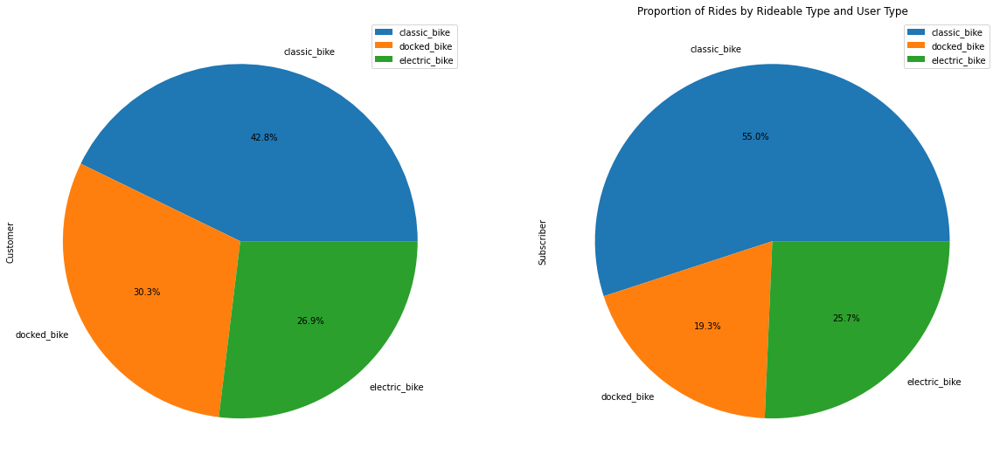

In [0]:
pivot_pd = rides_pd.pivot(index="rideable_type", columns="usertype", values="count")
pivot_pd.plot.pie(subplots=True,figsize=(20,10), autopct='%1.1f%%')
plt.title("Proportion of Rides by Rideable Type and User Type")
plt.show()

### Trend of Users over different stations

In [0]:
st_user = data.select("start_station_name", "end_station_name", "usertype")
st_user_df = st_user.toPandas()
st_user_df


,start_station_name,end_station_name,usertype
0,Orleans St & Elm St,Orleans St & Elm St,Subscriber
1,Desplaines St & Kinzie St,Kingsbury St & Kinzie St,Subscriber
2,Clark St & Grace St,Clark St & Leland Ave,Subscriber
3,Kingsbury St & Kinzie St,Desplaines St & Kinzie St,Subscriber
4,Desplaines St & Kinzie St,Kingsbury St & Kinzie St,Subscriber
...,...,...,...
26896109,Michigan Ave & 8th St,Mies van der Rohe Way & Chicago Ave,Subscriber
26896110,Kedzie Ave & Milwaukee Ave,Spaulding Ave & Armitage Ave,Subscriber
26896111,Clark St & Lake St,Calumet Ave & 18th St,Subscriber
26896112,Michigan Ave & Jackson Blvd,Clark St & Wrightwood Ave,Subscriber


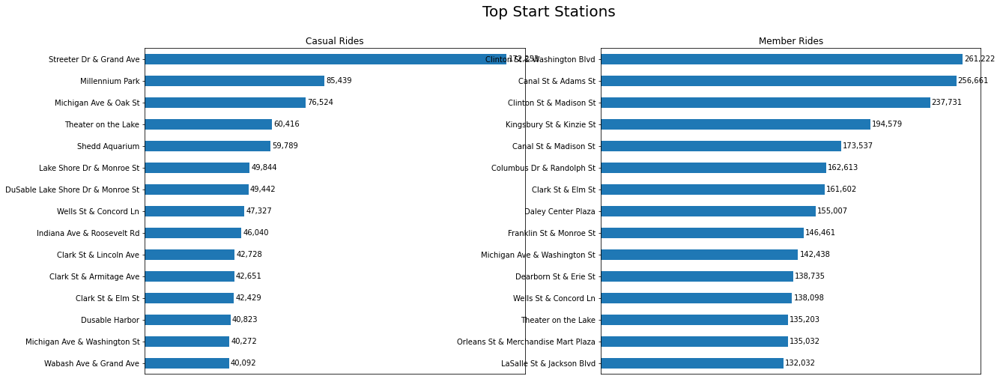

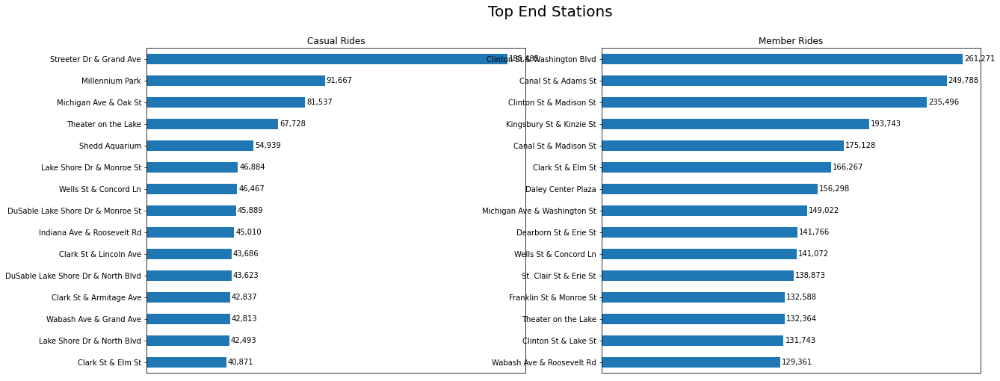

In [0]:
for point in ["start", "end"]:
    station_data = st_user_df.groupby("usertype")[f"{point}_station_name"].value_counts()

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 8))
    fig.suptitle(f"Top {point} Stations".title(), size=20)

    station_data.loc["Customer"].nlargest(15).sort_values()\
        .plot.barh(ax=ax1, title="Casual Rides")
    station_data.loc["Subscriber"].nlargest(15).sort_values()\
        .plot.barh(ax=ax2, title="Member Rides", color="#1f78b5" )

    for ax in [ax1, ax2]:
        ax.xaxis.set_visible(False)
        ax.set_ylabel("")
        for bars in ax.containers:
            ax.bar_label(bars, [f"{x:,}" for x in bars.datavalues], padding=2)

### Usages of rides by different users

In [0]:
min_df = data.select("started_at", "tripduration","usertype").toPandas()

In [0]:
min_df

,started_at,tripduration,usertype
0,2021-06-04 07:29:18,976,Subscriber
1,2021-06-23 08:39:36,121,Subscriber
2,2021-06-27 12:26:58,467,Subscriber
3,2021-06-01 12:30:24,158,Subscriber
4,2021-06-01 11:32:17,146,Subscriber
...,...,...,...
26896109,2018-06-30 23:58:55,"1,350.0",Subscriber
26896110,2018-06-30 23:59:48,537.0,Subscriber
26896111,2018-06-30 23:59:56,"1,038.0",Subscriber
26896112,2018-06-30 23:59:55,"2,295.0",Subscriber


#### Populating the most busiest stations

In [0]:
df_st = data.groupBy("start_station_name").count().orderBy(desc("count")).limit(10).toPandas()
df_st

,start_station_name,count
0,Clinton St & Washington Blvd,283426
1,Streeter Dr & Grand Ave,281865
2,Canal St & Adams St,281672
3,Clinton St & Madison St,266126
4,Kingsbury St & Kinzie St,226073
5,Clark St & Elm St,207219
6,Theater on the Lake,197346
7,Columbus Dr & Randolph St,195859
8,Canal St & Madison St,189489
9,Wells St & Concord Ln,187849


In [0]:
fig = px.histogram(df_st, x="start_station_name", y="count")

fig.update_layout(
    autosize=False,
    title='Most Busiest Stations' 
)

fig.update_traces(marker_color='lightseagreen')

fig.show()

In [0]:
df_st_least = data.groupBy("start_station_name").count().orderBy(("count")).limit(10).toPandas()
df_st_least

,start_station_name,count
0,Parnell Ave & 119th St,1
1,Troy & 111th St,1
2,New England Ave & Grace St,1
3,351,1
4,Christiana Ave & Bryn Mawr Ave,1
5,Baltimore Ave & 133rd St,1
6,Wallace St & 112 St,1
7,Avers Ave & Ogden Ave,1
8,Greenwood Ave & 87th St,1
9,Lyft Driver Center Private Rack,1


In [0]:
fig = px.histogram(df_st_least, x="start_station_name", y="count")

fig.update_layout(
    autosize=False,
    title='Least Busiest Stations' 
)

fig.update_traces(marker_color='lightseagreen')

fig.show()

#### Most commonly used bike types

In [0]:
bike_count = data.filter((col("rideable_type") == "classic_bike") | (col("rideable_type") == "electric_bike")| (col("rideable_type") == "docked_bike"))
df_bike = bike_count.groupBy('rideable_type').count().sort(desc("count")).toPandas()
df_bike

,rideable_type,count
0,classic_bike,6366207
1,electric_bike,3338837
2,docked_bike,3037601


In [0]:
fig = px.bar(df_bike, x='rideable_type', y='count')

fig.update_layout(
    autosize=False,
    title='Most Commonly Used Bike Types',
)

colors = ['blue', 'cadetblue', 'skyblue']
fig.update_traces(marker_color=colors)

fig.show()

#### Average trip duration w.r.t days of the week

In [0]:
average_usage_df = data.groupBy("Start_Day").agg(avg("tripduration").alias("average_tripduration")).toPandas()
average_usage_df

,Start_Day,average_tripduration
0,Wednesday,896.622768
1,Tuesday,672.828319
2,Friday,1020.781256
3,Thursday,924.935370
4,Saturday,1374.842700
5,Monday,979.602340
6,Sunday,1413.292882
7,None,716.257889


Out[65]: Text(0.5, 1.0, 'Average Trip Duration w.r.t days of the week')

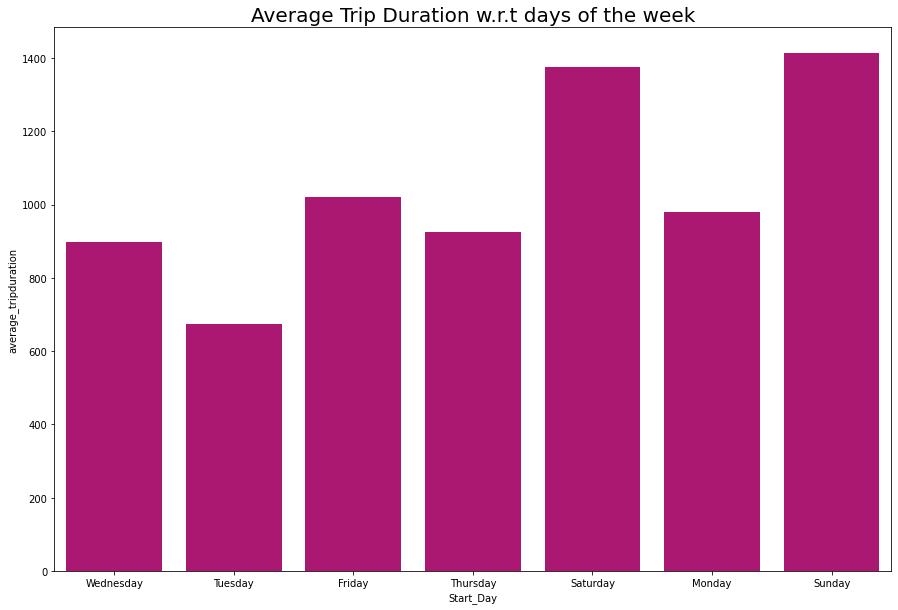

In [0]:
plt.figure(figsize=(15,10))
sns.barplot(x = 'Start_Day', y = 'average_tripduration', data = average_usage_df,color= "#C20078")
plt.title("Average Trip Duration w.r.t days of the week", size = 20)

#### Busiest Day of the week

In [0]:
df_day = data.groupBy('Start_Day').count().sort(desc("count")).toPandas()
df_day

,Start_Day,count
0,None,7854156
1,Saturday,2875235
2,Thursday,2803866
3,Wednesday,2799974
4,Friday,2783716
5,Tuesday,2736344
6,Monday,2574862
7,Sunday,2467961


Out[67]: Text(0.5, 1.0, 'Busiest Day of the Week')

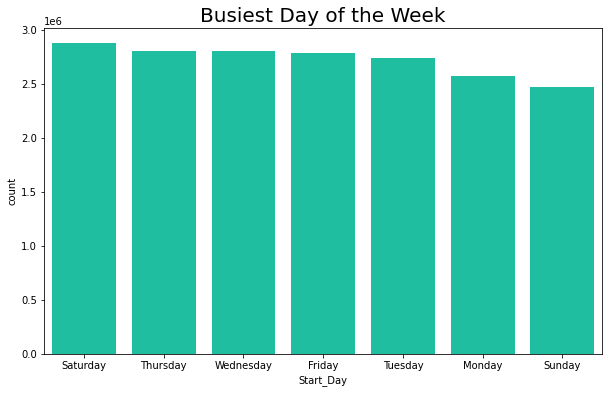

In [0]:
plt.figure(figsize=(10,6))
sns.barplot(x = 'Start_Day',y = 'count',data = df_day,color= "#04D8B2")
plt.title("Busiest Day of the Week", size = 20)

#### Busiest Hour of the day

In [0]:
df_h = data.groupBy('Start_Hour').count().sort(desc("count")).toPandas()
(df_h)

,Start_Hour,count
0,NaN,7854156
1,17.0,2130965
2,16.0,1725300
3,18.0,1642484
4,15.0,1282007
5,8.0,1158470
6,19.0,1155815
7,14.0,1105989
8,13.0,1099132
9,12.0,1093785


Out[69]: Text(0.5, 1.0, 'Busiest Hour of the Day')

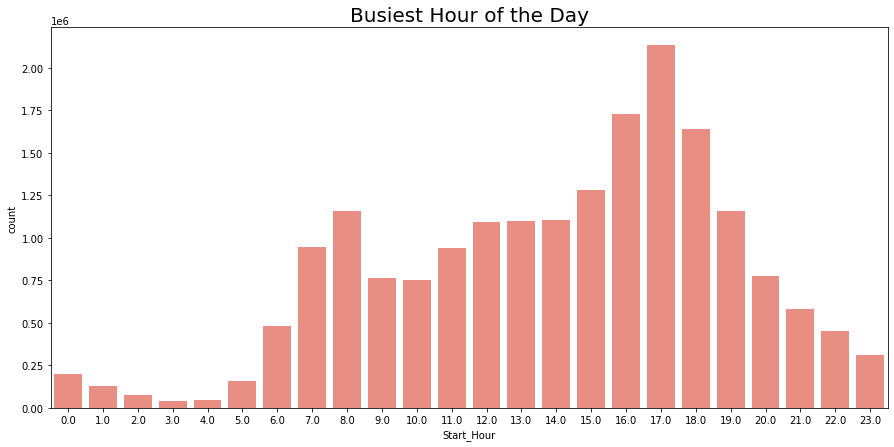

In [0]:
plt.figure(figsize=(15,7))
sns.barplot(x = 'Start_Hour',y = 'count',data = df_h,color= "salmon")
plt.title("Busiest Hour of the Day", size = 20)

#### Identifying the usage w.r.t Gender

In [0]:
gender = data.filter((col("gender") == "Male") | (col("gender") == "Female"))

In [0]:
df_gen = gender.groupBy('gender').count().sort(desc("count")).toPandas()
df_gen

,gender,count
0,Male,10250123
1,Female,3476460


Out[72]: Text(0.5, 1.0, 'Usage - Male VS Female')

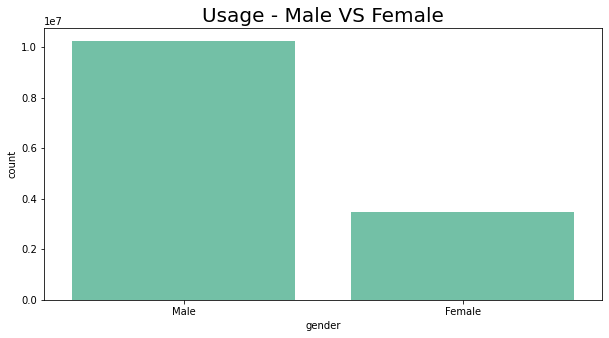

In [0]:
plt.figure(figsize=(10,5))
sns.barplot(x = 'gender', y = 'count', data = df_gen, color= "mediumaquamarine")
plt.title("Usage - Male VS Female", size = 20)

#### Identifying users according to their birthyear

In [0]:
age = data.filter((data["birthyear"] >= 1900) & (data["birthyear"] <= 2023))

In [0]:
df_age = age.groupBy('birthyear').count().sort(desc("count")).toPandas()
df_age

,birthyear,count
0,1989,799616
1,1990,732737
2,1988,707280
3,1987,684854
4,1991,682669
...,...,...
92,1910,6
93,1905,6
94,2014,5
95,1925,2


In [0]:
df_age = df_age.sort_values(by='count', ascending=False)
df_age1 = df_age.head(10)
df_age1

,birthyear,count
0,1989,799616
1,1990,732737
2,1988,707280
3,1987,684854
4,1991,682669
5,1992,666310
6,1986,640764
7,1985,595075
8,1984,571184
9,1993,544161


Out[76]: Text(0.5, 1.0, 'Top User Birth Years')

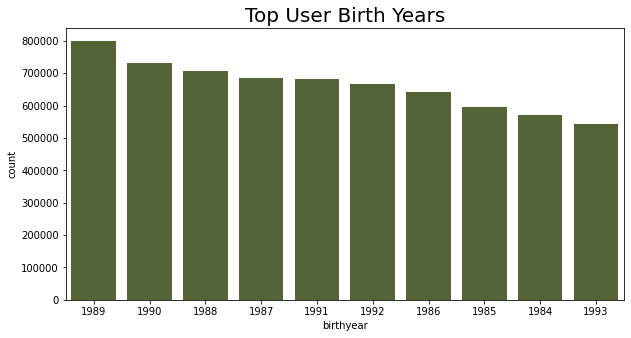

In [0]:
plt.figure(figsize=(10,5))
sns.barplot(x = 'birthyear',y = 'count',data = df_age1,color= "darkolivegreen")
plt.title("Top User Birth Years", size = 20)

**Challenges**
- Clean the data by removing duplicates, filling in missing values, and handling outliers
- As we have inconsistent and huge data, it is difficult to set data under same pace
- Once the data is structured , we could be able to analyze more where give a proper statistic to the client
- Explore more trends by visualizing the data using tools such as matplotlib, seaborn, or plotly

**Recommendations**

- Improve infrastructure: Identify stations with high ride demand and ensure adequate bike availability, docking spaces, and maintenance at those locations.

- Target marketing efforts: Develop targeted marketing campaigns to encourage casual customers to become subscribers. Highlight the benefits of membership, such as cost savings or access to exclusive features.

- Optimize operations: Analyze ride patterns by day of the week to allocate resources effectively. Adjust bike availability and staffing levels based on peak demand days or hours.

- Enhance user experience: Monitor trip durations to identify potential bottlenecks or issues affecting user experience. Address any infrastructure limitations or areas with longer-than-average trip durations.

- Expand service: Explore opportunities to expand the bike-sharing service to new areas or communities, considering the popularity of certain stations and user preferences.